In [1]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
import xgcm
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *
from mitequinox.plot import *

In [2]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6, walltime='02:00:00')
w = cluster.scale(6*10)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.135.39.30:43734 Dashboard: http://10.135.39.30:8787/status,Cluster Workers: 60 Cores: 60 Memory: 1.00 TB


___________
# Useful info.

In [5]:
#grd = load_grd(ftype='nc').reset_coords()
grd = load_grd().reset_coords()
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([mask, grd])
#print(grd_rspec)

# !! chunking is coarse for the netcdf grid

In [6]:
# coriolis term
lat = grd_rspec['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat))
f_ij

<xarray.DataArray 'YC' (face: 13, j: 4320, i: 4320)>
dask.array<mul, shape=(13, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319

_________
# 1. Horizontal advection term (in terms of KE and Rossby number)

## 1.1 KE from raw uv (KE_uv_fxx)

In [10]:
# KE from raw uv

dij=4
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = work_data_dir+'xy/2_advection_term/KE_uv_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsu = ( xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('u',face))
                .isel(i_g=slice(0,None,dij), j=slice(0,None,dij)) )
        dsv = (xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('v',face))
               .isel(i=slice(0,None,dij), j_g=slice(0,None,dij)) )
        fs = f_ij.isel(face=face, i=slice(0,None,dij), j=slice(0,None,dij))
        
        ds = xr.merge([dsu.rename({'i_g': 'i'}), dsv.rename({'j_g': 'j'})], 
                      compat='equals').assign_coords(**grd_rspec.sel(face=face))

        # !!! check signs (checked on 08/30), will need to be normalized by Coriolis frequency !!!
        # compute ageostrophic velocities
        
        KE = (-ds['v_coriolis_linear']/fs)**2 + (ds['u_coriolis_linear']/fs)**2
        print(KE)
        # should show the size of the dataset to know if we can load it in memory
        print('dataset size: %.1f GB' %(KE.nbytes / 1e9))

        # store
        KE = KE.rename('KE')
        KE = KE.to_dataset()
        for c in KE.coords:
            try:
                del KE[c].encoding['chunks']
            except:
                print(c)        
        KE = KE.chunk({'i': 24*8, 'j':47*4})
        %time KE.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

<xarray.DataArray (j: 1080, i: 1080, time: 8640)>
dask.array<add, shape=(1080, 1080, 8640), dtype=float32, chunksize=(24, 47, 8640), chunktype=numpy.ndarray>
Coordinates:
    dxC      (j, i) float32 1261.4568 1261.4568 ... 2250.5652 2250.5652
    dyG      (j, i) float32 1230.9597 1230.9597 1230.9597 ... 2073.123 2073.123
    f_j      (j, i) float32 -0.00012231508 -0.00012231508 ... 3.447235e-05
    face     int64 1
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 ... 3.68e+07 3.68e+07
    dxG      (j, i) float32 1261.269 1261.269 1261.269 ... 2250.654 2250.654
    dyC      (j, i) float32 1230.864 1230.864 1230.864 ... 2073.2131 2073.2131
    f_i      (j, i) float32 -0.00012232276 -0.00012232276 ... 3.4449287e-05
    Depth    (j, i) float32 3047.2024 3129.34 3359.4492 ... 2131.7 2131.7
    XC       (j, i) float32 -37.9895

## 1.2 Rossby number

In [5]:
#grd = load_grd(ftype='nc').reset_coords()
grd = load_grd().reset_coords()
mask = ((grd.hFacW.rename({'i_g': 'i'}) == 1) &
        (grd.hFacS.rename({'j_g': 'j'}) == 1) 
       ).rename('mask').reset_coords(drop=True)
grd_rspec = xr.merge([mask, grd.dxC, grd.dyC, grd.Depth, grd.rA, grd.XC,grd.YC])

# coriolis term
lat = grd_rspec['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat))

In [ ]:
# spatial strides for decimation
dij=4
overwrite=True
    
for face in range(13):

    Efile = work_data_dir+'xy/2_advection_term/Ro_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        # load data
        dsu = xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('u',face))
        dsv = xr.open_zarr(work_data_dir+'rechunked/%s_mbal_xy_f%02d.zarr'%('v',face))
               
        fs = f_ij.isel(face=face)
        
        ds = xr.merge([dsu, dsv],compat='equals').assign_coords(**grd_rspec.sel(face=face))       
        grid = xgcm.Grid(ds, coords={'X':{'center':'i', 'left':'i_g'},
                                     'Y':{'center':'j', 'left':'j_g'}}, periodic=['X', 'Y'])
        
        Ro = (grid.diff(ds.dyG * ds['u_coriolis_linear'],'X') - grid.diff(ds.dxG * -ds['v_coriolis_linear'],'Y'))/ds.rA/fs/fs # relative vorticity  v_x-u_y
        Ro = Ro.isel(i=slice(0,None,dij), j=slice(0,None,dij))
        Ro = Ro.rename('Ro')
        Ro = Ro.to_dataset()
        print(Ro)
        
        for c in Ro.coords:
            try:
                del Ro[c].encoding['chunks']
            except:
                print(c)        
                
        Ro = Ro.chunk({'i': 24*8, 'j':47*4})
        #print(Ro)
        %time Ro.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face) 


## 1.3 RMS results

In [62]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_Ro = xr.concat([xr.open_zarr(work_data_dir+'xy/2_advection_term/Ro_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
print(ds_Ro)

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080, time: 8640)
Coordinates:
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 ... 3.68e+07 3.68e+07
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    mask     (face, j, i) bool dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    rA       (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
Data variables:
    Ro       (face, j, i, time) float32 dask.array<chunksize=(1, 188, 192, 8640), meta=np.ndarray>


In [21]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_KE = xr.concat([xr.open_zarr(work_data_dir+'xy/2_advection_term/KE_uv_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
print(ds_KE)

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080, time: 8640)
Coordinates:
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 ... 3.68e+07 3.68e+07
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dxC      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dxG      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dyC      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dyG      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    f_i      (face, j, i) float32 dask.array<chunksize=(1, 188, 192)

In [9]:
Ro_RMS = (ds_Ro['Ro']**2).mean(['time'])
Ro_RMS = np.real(Ro_RMS).rename('Ro_RMS')

file_E = work_data_dir+'xy/2_advection_term/Ro_RMS.zarr'
Ro_RMS.to_dataset().to_zarr(file_E, mode='w')

In [10]:
KE_RMS = (ds_KE['KE']).mean(['time'])
KE_RMS = np.real(KE_RMS).rename('KE_RMS')

file_E = work_data_dir+'xy/2_advection_term/KE_RMS.zarr'
KE_RMS.to_dataset().to_zarr(file_E, mode='w')

## 2. Figures

In [7]:
KE_RMS = xr.open_zarr(work_data_dir+'xy/2_advection_term/KE_RMS.zarr')
Ro_RMS = xr.open_zarr(work_data_dir+'xy/2_advection_term/Ro_RMS.zarr')
KE_RMS = KE_RMS.KE_RMS
Ro_RMS = Ro_RMS.Ro_RMS

In [8]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo = xr.concat(D, dim='face')
E_ageo = ds_ageo.E_all
E_ageo_high = ds_ageo.E_high

In [9]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/total_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_total = xr.concat(D, dim='face')
E_total = ds_total.E_all
E_high = ds_total.E_high

In [10]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

In [11]:
# coriolis term
lat = grd_rspec['YC']
omega = 7.3/100000
dij=4
f_ij = 2*omega*np.sin(np.deg2rad(lat))
fs = f_ij.isel(i=slice(0,None,dij), j=slice(0,None,dij))
fs

<xarray.DataArray 'YC' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float32, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

In [12]:
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
dij=4 
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij)) 
ice

<xarray.DataArray 'AREA' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

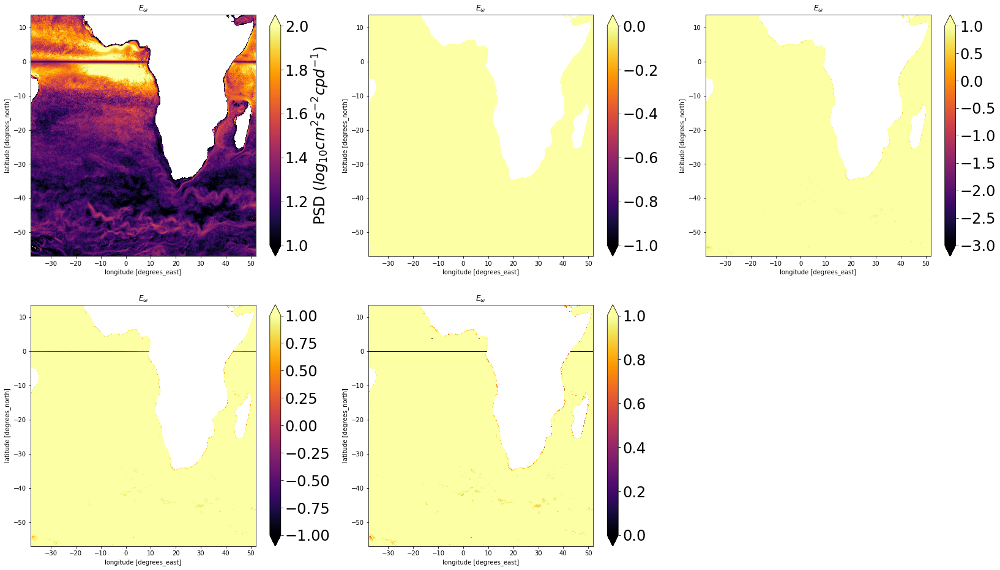

In [28]:
font_size = 24

fig = plt.figure(figsize = (28,16))

ax=plt.subplot(231)
cax = np.log10(np.sqrt(KE_RMS.isel(face=1)/(Ro_RMS.isel(face=1) * (fs.isel(face=1)**2)))/1000).plot(x='XC', y='YC',vmin=1.0, vmax=2.0, cmap='inferno', add_colorbar = False)
ax.set_title('$E_{\omega}$')
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=font_size)
cbar.set_label('PSD ($log_{10} cm^2 s^{-2} cpd^{-1})$', fontsize=font_size)

ax=plt.subplot(232)
cax =np.log10(np.sqrt(KE_RMS.isel(face=1)/(Ro_RMS.isel(face=1) * (fs.isel(face=1)**2)))/1000).plot(x='XC', y='YC',vmin=-1, vmax=0, cmap='inferno', add_colorbar = False)
ax.set_title('$E_{\omega}$')
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=font_size)

ax=plt.subplot(233)
cax =np.log10(np.sqrt(KE_RMS.isel(face=1)/(Ro_RMS.isel(face=1) * (fs.isel(face=1)**2)))/1000).plot(x='XC', y='YC',vmin=-3, vmax=1, cmap='inferno', add_colorbar = False)
ax.set_title('$E_{\omega}$')
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=font_size)

ax=plt.subplot(234)
cax =np.log10(np.sqrt(KE_RMS.isel(face=1)/(Ro_RMS.isel(face=1) * (fs.isel(face=1)**2)))/1000).plot(x='XC', y='YC',vmin=-1, vmax=1, cmap='inferno', add_colorbar = False)
ax.set_title('$E_{\omega}$')
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=font_size)

ax=plt.subplot(235)
cax =np.log10(np.sqrt(KE_RMS.isel(face=1)/(Ro_RMS.isel(face=1) * (fs.isel(face=1)**2)))/1000).plot(x='XC', y='YC',vmin=0, vmax=1, cmap='inferno', add_colorbar = False)
ax.set_title('$E_{\omega}$')
cbar = plt.colorbar(cax, ax=ax, extend='both', orientation='vertical')
cbar.ax.tick_params(labelsize=font_size)

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

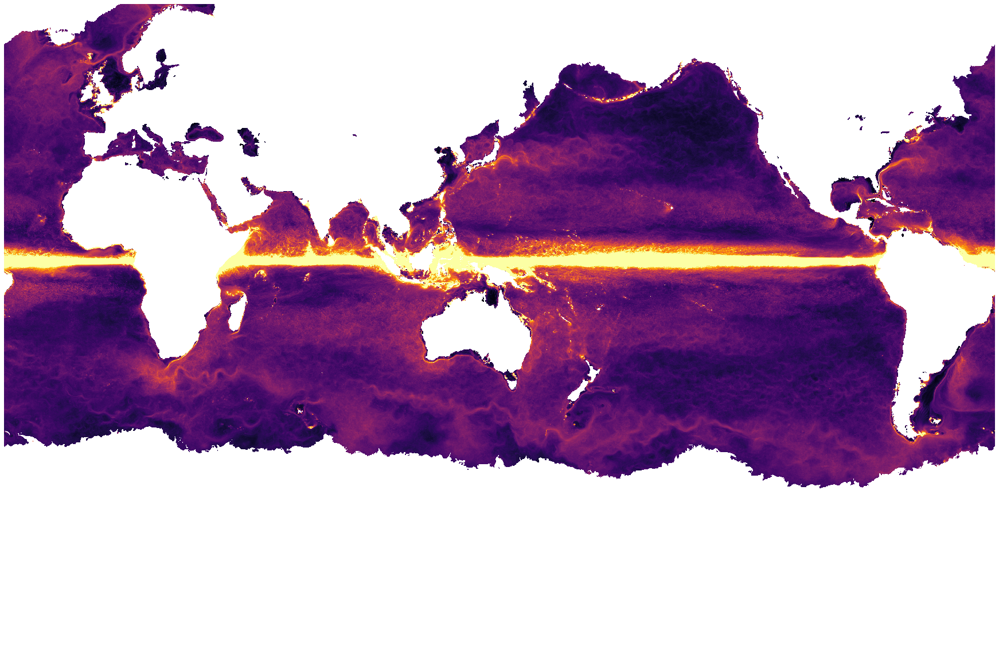

In [14]:
quick_llc_plot(np.sqrt(Ro_RMS).where(ice>0), vmin=0, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

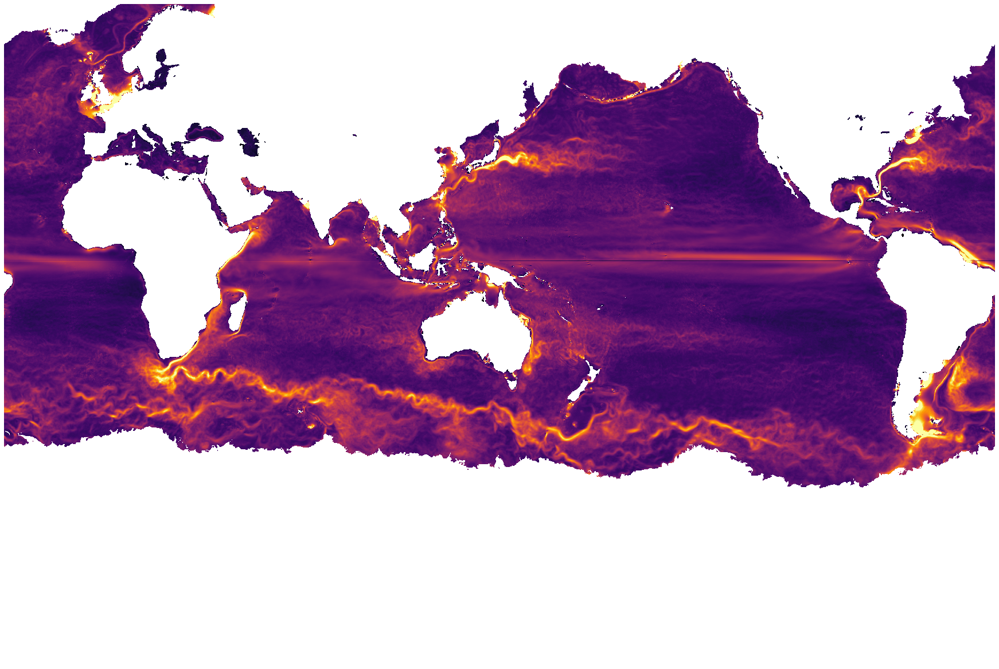

In [15]:
quick_llc_plot(np.sqrt(KE_RMS).where(ice>0), vmin=0, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

In [69]:
length_scale = np.log10(np.sqrt(KE_RMS/(Ro_RMS * (fs**2)))/1000)
length_scale

<xarray.DataArray (face: 13, j: 1080, i: 1080)>
dask.array<log10, shape=(13, 1080, 1080), dtype=float32, chunksize=(1, 188, 192), chunktype=numpy.ndarray>
Coordinates:
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    XC       (face, j, i) float32 -114.93228 -114.93183 ... -114.52893
    YC       (face, j, i) float32 -88.17715 -88.18883 ... -88.16518 -88.165405
    dxC      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dxG      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dyC      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    dyG      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    f_i      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
    f_j      (face, j, i) float32 dask.array<chunksize=(1, 188, 192), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

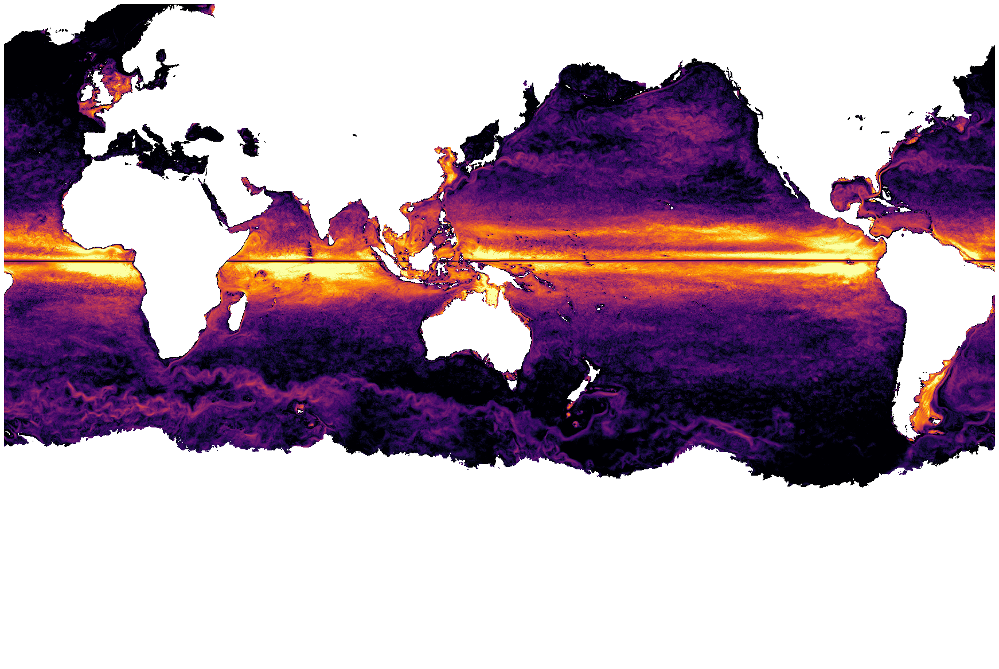

In [70]:
quick_llc_plot(length_scale.where(ice>0), vmin=1, vmax=2, add_colorbar=False, axis_off=True, cmap='inferno')

In [21]:
length_scale2 = np.log10(np.sqrt(E_total/(Ro_RMS * (fs**2)))/1000)
length_scale2

<xarray.DataArray (face: 13, j: 1080, i: 1080)>
dask.array<log10, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 188, 192), chunktype=numpy.ndarray>
Coordinates:
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
    Depth    (face, j, i) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    XC       (face, j, i) float32 -114.93228 -114.93183 ... -114.52893
    YC       (face, j, i) float32 -88.17715 -88.18883 ... -88.16518 -88.165405
    dxC      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxG      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyC      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyG      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_i      (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

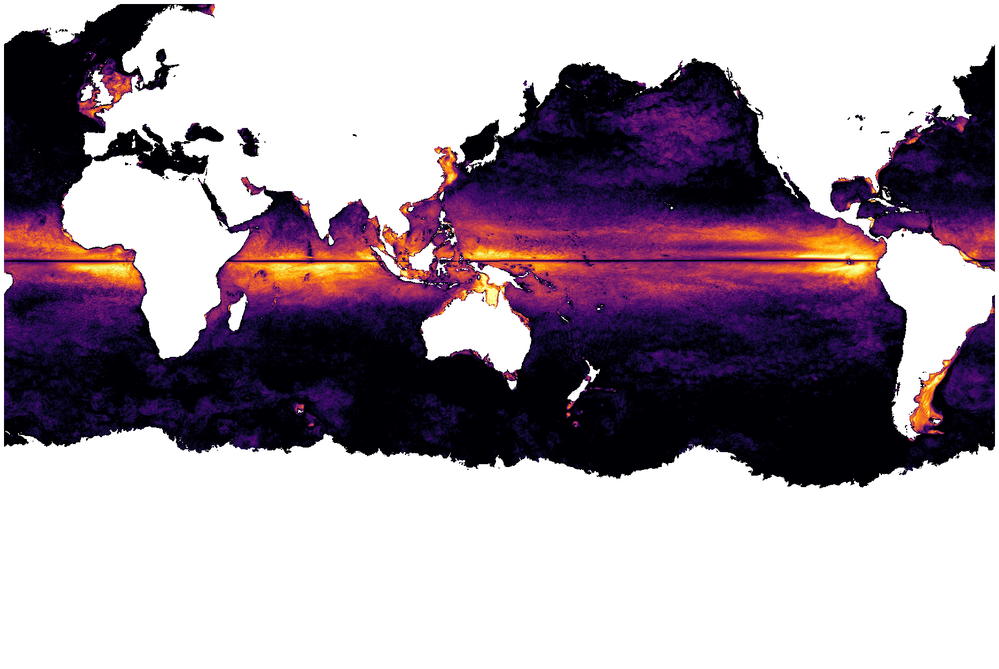

In [22]:
quick_llc_plot(length_scale2.where(ice>0), vmin=1, vmax=2, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

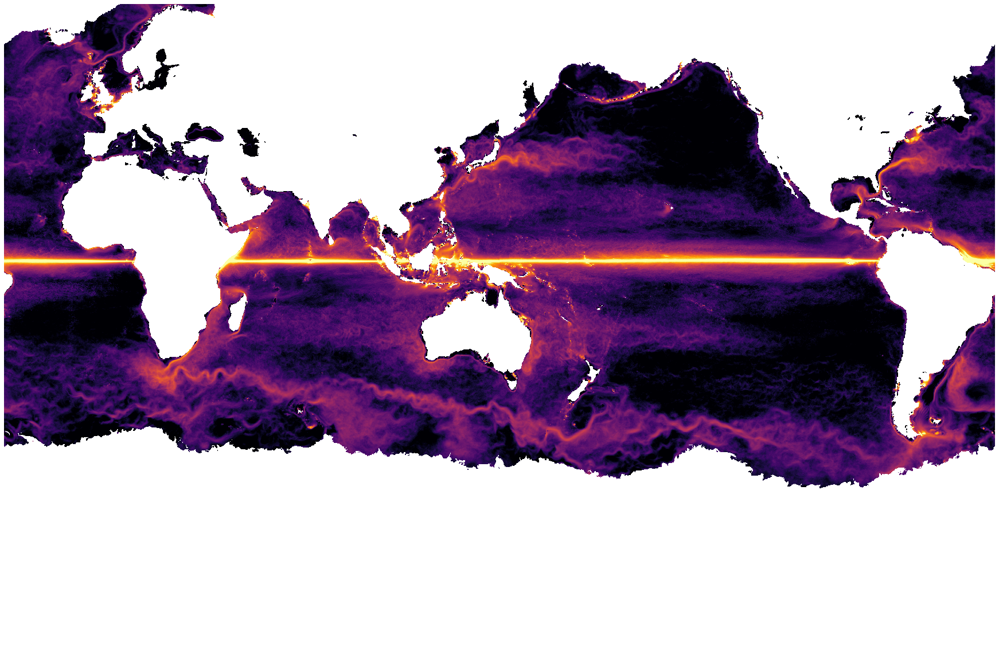

In [13]:
quick_llc_plot(np.log10(Ro_RMS.where(ice>0)*KE_RMS.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

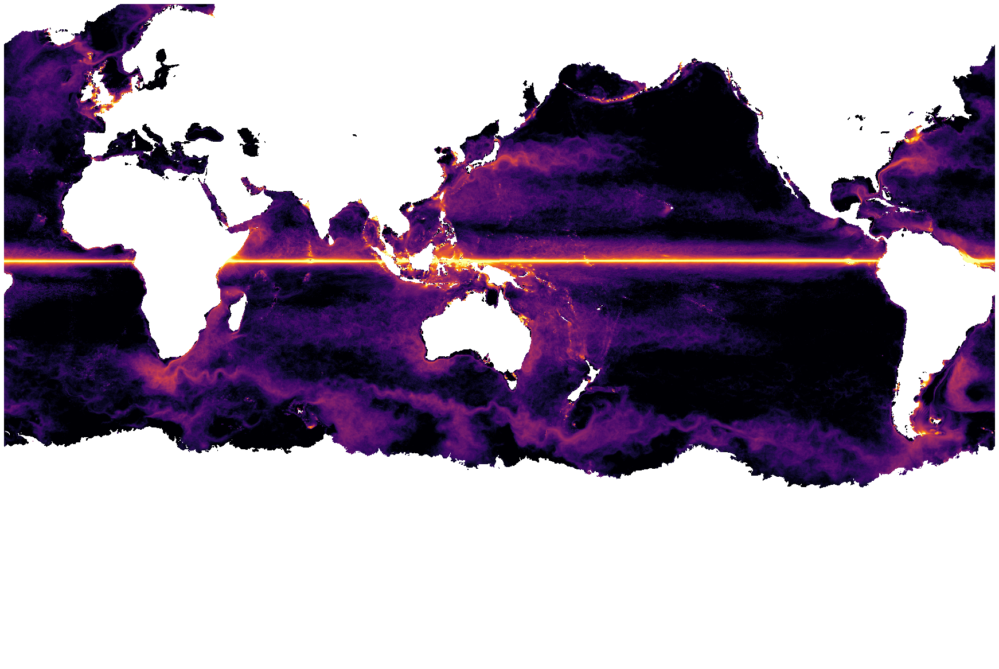

In [17]:
quick_llc_plot(np.log10(Ro_RMS.where(ice>0)*E_total.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

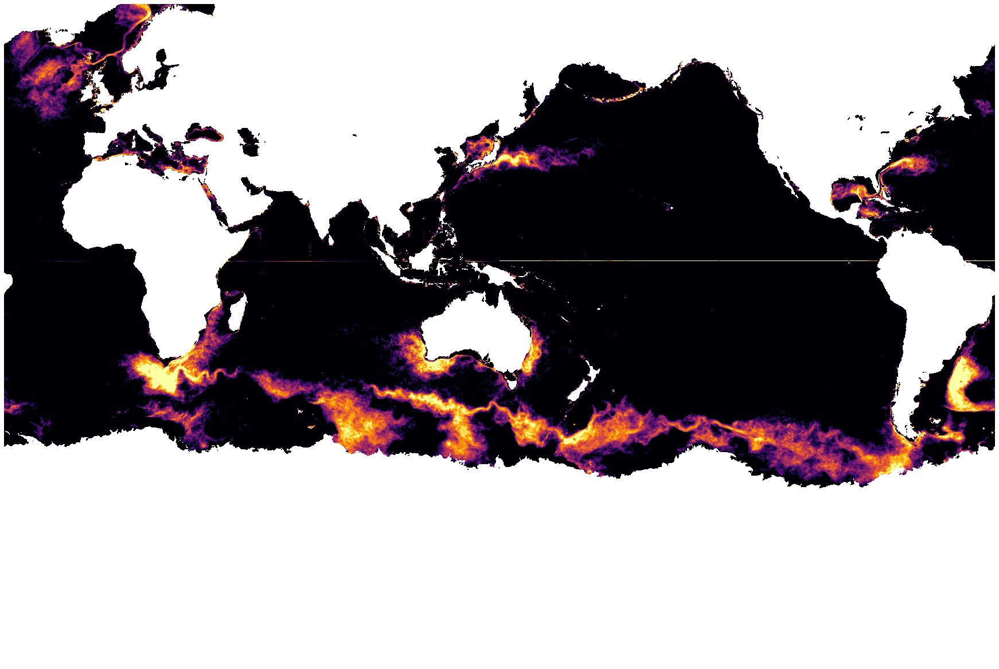

In [18]:
quick_llc_plot(np.log10(Ro_RMS*E_total.where(ice>0)/E_ageo.where(ice>0)), vmin=-1, vmax=0, add_colorbar=False, axis_off=True, cmap='inferno')

_______
# 3: Direct comparison of RMS (ageo uv) and predicted time series 

In [17]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_aKE = xr.concat([xr.open_zarr(work_data_dir+'xy/comparison/u_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
u_ageo = ds_aKE.u_ageo
u_all = ds_aKE.u

In [18]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_aKE = xr.concat([xr.open_zarr(work_data_dir+'xy/comparison/v_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
v_ageo = ds_aKE.v_ageo
v_all = ds_aKE.v

In [9]:
u_ageo_RMS = (u_ageo**2).mean(['time'])
u_ageo_RMS = np.real(u_ageo_RMS).rename('u_ageo_RMS')

file_E = work_data_dir+'xy/comparison/u_ageo_RMS.zarr'
u_ageo_RMS.to_dataset().to_zarr(file_E, mode='w')

In [10]:
v_ageo_RMS = (v_ageo**2).mean(['time'])
v_ageo_RMS = np.real(v_ageo_RMS).rename('v_ageo_RMS')

file_E = work_data_dir+'xy/comparison/v_ageo_RMS.zarr'
v_ageo_RMS.to_dataset().to_zarr(file_E, mode='w')

In [42]:
u_all_RMS = (u_all**2).mean(['time'])
u_all_RMS = np.real(u_all_RMS).rename('u_all_RMS')

file_E = work_data_dir+'xy/comparison/u_all_RMS.zarr'
u_all_RMS.to_dataset().to_zarr(file_E, mode='w')

In [43]:
v_all_RMS = (v_all**2).mean(['time'])
v_all_RMS = np.real(v_all_RMS).rename('v_all_RMS')

file_E = work_data_dir+'xy/comparison/v_all_RMS.zarr'
v_all_RMS.to_dataset().to_zarr(file_E, mode='w')

## Read results

In [13]:
u_ageo_RMS = xr.open_zarr(work_data_dir+'xy/comparison/u_ageo_RMS.zarr')
v_ageo_RMS = xr.open_zarr(work_data_dir+'xy/comparison/v_ageo_RMS.zarr')
u_ageo_RMS = u_ageo_RMS.u_ageo_RMS
v_ageo_RMS = v_ageo_RMS.v_ageo_RMS

In [14]:
u_all_RMS = xr.open_zarr(work_data_dir+'xy/comparison/u_all_RMS.zarr')
v_all_RMS = xr.open_zarr(work_data_dir+'xy/comparison/v_all_RMS.zarr')
u_all_RMS = u_all_RMS.u_all_RMS
v_all_RMS = v_all_RMS.v_all_RMS

# Time series

In [6]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
dudt = xr.concat([xr.open_zarr(work_data_dir+'xy/1_time_term/du_dt_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
dvdt = xr.concat([xr.open_zarr(work_data_dir+'xy/1_time_term/dv_dt_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')

In [7]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_aKE = xr.concat([xr.open_zarr(work_data_dir+'xy/comparison/u_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
u_ageo = ds_aKE.u_ageo
u_all = ds_aKE.u

In [8]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_aKE = xr.concat([xr.open_zarr(work_data_dir+'xy/comparison/v_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')
v_ageo = ds_aKE.v_ageo
v_all = ds_aKE.v

In [9]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_Ro = xr.concat([xr.open_zarr(work_data_dir+'xy/2_advection_term/Ro_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')

In [10]:
F = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ds_KE = xr.concat([xr.open_zarr(work_data_dir+'xy/2_advection_term/KE_uv_f%02d.zarr'%(face))
              for face in F], dim='face', compat='identical')

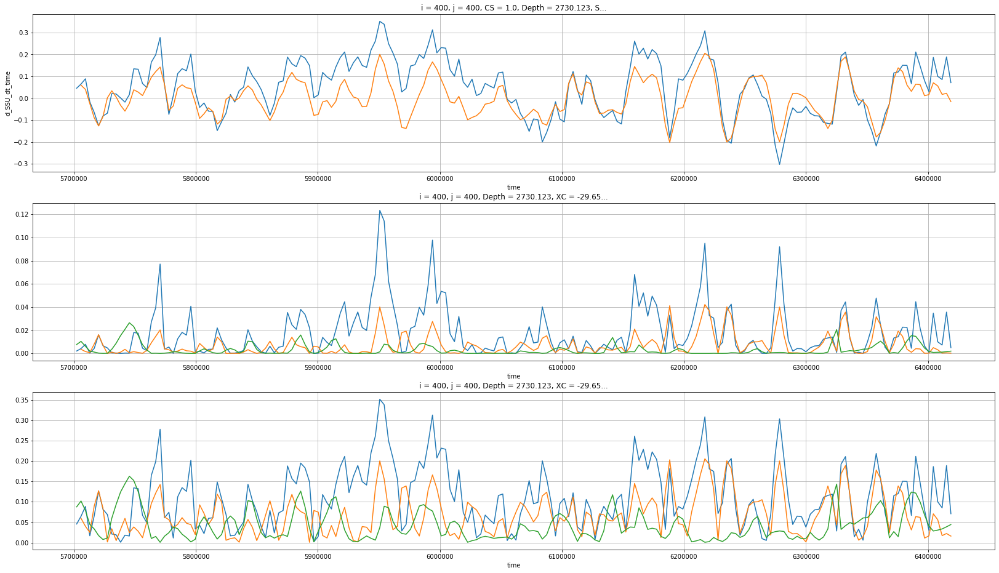

In [11]:
fig = plt.figure(figsize = (28,16))

ax=plt.subplot(311)
(v_ageo.isel(face=1,i=100,j=100,time=slice(0,200))).plot()
(dudt.d_SSU_dt_time.isel(face=1,i=100,j=100,time=slice(0,200))).plot()
ax.grid()

ax=plt.subplot(312)
(v_ageo.isel(face=1,i=100,j=100,time=slice(0,200))**2).plot()
(dudt.d_SSU_dt_time.isel(face=1,i=100,j=100,time=slice(0,200))**2).plot()
( (ds_Ro['Ro'].isel(face=1,i=100,j=100,time=slice(0,200))**2) * ( (u_all.isel(face=1,i=100,j=100,time=slice(0,200)))**2 + v_all.isel(face=1,i=100,j=100,time=slice(0,200))**2 ) ).plot()
ax.grid()

ax=plt.subplot(313)
np.sqrt(v_ageo.isel(face=1,i=100,j=100,time=slice(0,200))**2).plot()
np.sqrt(dudt.d_SSU_dt_time.isel(face=1,i=100,j=100,time=slice(0,200))**2).plot()
np.sqrt( (ds_Ro['Ro'].isel(face=1,i=100,j=100,time=slice(0,200))**2) * ( (u_all.isel(face=1,i=100,j=100,time=slice(0,200)))**2 + v_all.isel(face=1,i=100,j=100,time=slice(0,200))**2 ) ).plot()
ax.grid()

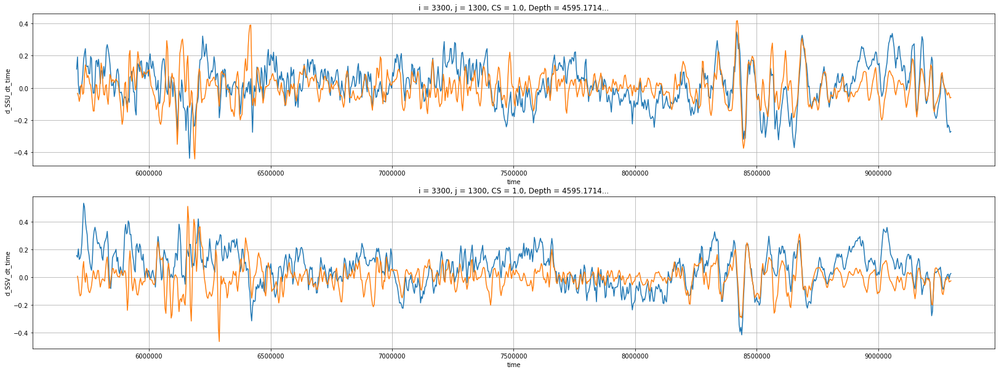

In [27]:
fig = plt.figure(figsize = (28,10))

ax=plt.subplot(211)
v_ageo.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1300).plot()
dudt.d_SSU_dt_time.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1300).plot()
ax.grid()

ax=plt.subplot(212)
u_ageo.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1300).plot()
(-1*dvdt.d_SSV_dt_time.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1300)).plot()
ax.grid()

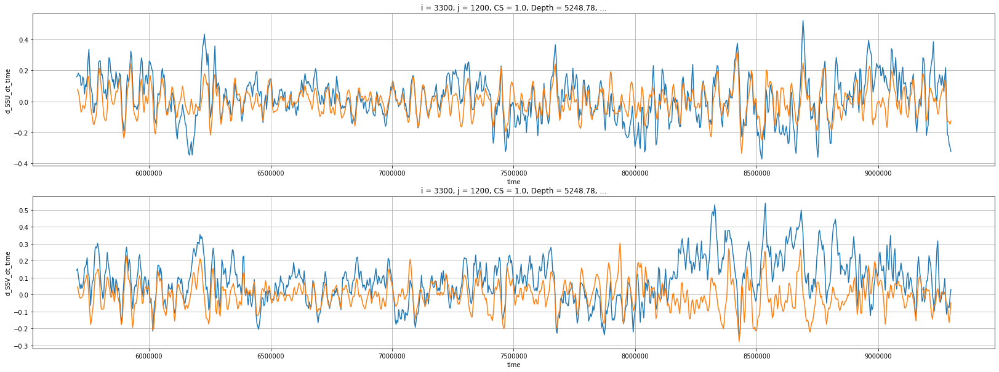

In [26]:
fig = plt.figure(figsize = (28,10))

ax=plt.subplot(211)
v_ageo.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1200).plot()
dudt.d_SSU_dt_time.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1200).plot()
ax.grid()

ax=plt.subplot(212)
u_ageo.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1200).plot()
(-1*dvdt.d_SSV_dt_time.isel(face=1,time=slice(0,1000)).sel(i=3300,j=1200)).plot()
ax.grid()

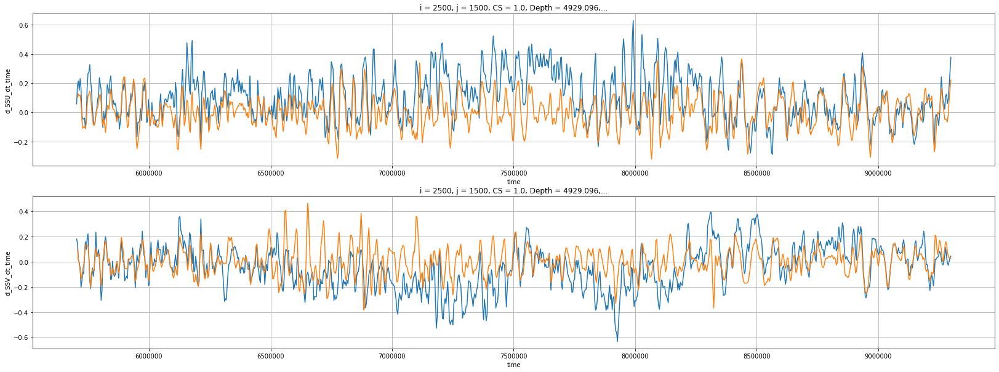

In [25]:
fig = plt.figure(figsize = (28,10))

ax=plt.subplot(211)
v_ageo.isel(face=1,time=slice(0,1000)).sel(i=2500,j=1500).plot()
dudt.d_SSU_dt_time.isel(face=1,time=slice(0,1000)).sel(i=2500,j=1500).plot()
ax.grid()

ax=plt.subplot(212)
u_ageo.isel(face=1,time=slice(0,1000)).sel(i=2500,j=1500).plot()
(-1*dvdt.d_SSV_dt_time.isel(face=1,time=slice(0,1000)).sel(i=2500,j=1500)).plot()
ax.grid()

In [14]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
distributed.utils - ERROR - 
Traceback (most recent call last):
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/utils.py", line 666, in log_errors
    yield
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1276, in _close
    await gen.with_timeout(timedelta(seconds=2), list(coroutines))
concurrent.futures._base.CancelledError
distributed.utils - ERROR - 
Traceback (most recent call last):
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/utils.py", line 666, in log_errors
    yield
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1005, in _reconnect
    await self._close()
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1276, in _close
    await gen.with_timeout(timedelta(seconds=